<a href="https://colab.research.google.com/github/andrehochuli/teaching/blob/main/ComputerVision/Lecture%2008%20%20-%20Image%20Segmentation/yolo-ultralytics/Lecture_08-YoloTraining.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Enviroment Preparation

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.2 MB/s eta 0:00:00


In [2]:
!wget wget https://github.com/andrehochuli/teaching/raw/refs/heads/main/datasets/EuroCoins.zip

--2025-10-14 22:22:25--  http://wget/
Resolving wget (wget)... failed: Name or service not known.
wget: unable to resolve host address ‘wget’
--2025-10-14 22:22:25--  https://github.com/andrehochuli/teaching/raw/refs/heads/main/datasets/EuroCoins.zip
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/andrehochuli/teaching/refs/heads/main/datasets/EuroCoins.zip [following]
--2025-10-14 22:22:26--  https://raw.githubusercontent.com/andrehochuli/teaching/refs/heads/main/datasets/EuroCoins.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11142098 (11M) [application/zip]
Saving to: ‘EuroCoins.zip’

E

In [3]:
!unzip EuroCoins.zip

Archive:  EuroCoins.zip
  inflating: images/001.jpg          
  inflating: images/002.jpg          
  inflating: images/003.jpg          
  inflating: images/004.jpg          
  inflating: images/005.jpg          
  inflating: images/006.jpg          
  inflating: images/007.jpg          
  inflating: images/008.jpg          
  inflating: images/009.jpg          
  inflating: images/010.jpg          
  inflating: images/011.jpg          
  inflating: images/012.jpg          
  inflating: images/013.jpg          
  inflating: images/014.jpg          
  inflating: images/015.jpg          
  inflating: images/016.jpg          
  inflating: images/017.jpg          
  inflating: images/018.jpg          
  inflating: images/019.jpg          
  inflating: images/020.jpg          
  inflating: images/021.jpg          
  inflating: images/022.jpg          
  inflating: images/023.jpg          
  inflating: images/024.jpg          
  inflating: images/025.jpg          
  inflating: images/026.jp

#Dataset Structure

In [4]:
import os
import shutil
import random
from pathlib import Path

# Caminhos de entrada
IMG_DIR = Path('images')   # pasta atual das imagens originais
LBL_DIR = Path('labels')   # pasta atual dos labels originais

# Caminhos de saída
OUT_DIRS = {
    'train': {'img': Path('dataset/images/train'), 'lbl': Path('dataset/labels/train')},
    'val': {'img': Path('dataset/images/val'), 'lbl': Path('dataset/labels/val')},
    'test': {'img': Path('dataset/images/test'), 'lbl': Path('dataset/labels/test')}
}

# Criar pastas destino
for split in OUT_DIRS.values():
    split['img'].mkdir(parents=True, exist_ok=True)
    split['lbl'].mkdir(parents=True, exist_ok=True)

# Proporção de divisão
train_ratio = 0.65
val_ratio = 0.15
test_ratio = 0.20

# Listar imagens
images = [f for f in IMG_DIR.iterdir() if f.suffix.lower() in ['.jpg', '.png', '.jpeg']]

random.shuffle(images)

# Cálculo dos tamanhos
n = len(images)
train_end = int(n * train_ratio)
val_end = train_end + int(n * val_ratio)

train_files = images[:train_end]
val_files = images[train_end:val_end]
test_files = images[val_end:]

def copy_files(files, img_dst, lbl_dst):
    for img_path in files:
        lbl_path = LBL_DIR / f"{img_path.stem}.txt"
        if not lbl_path.exists():
            print(f"Aviso: Label não encontrado para {img_path.name}")
            continue
        shutil.copy(img_path, img_dst / img_path.name)
        shutil.copy(lbl_path, lbl_dst / lbl_path.name)

# Mover os arquivos
copy_files(train_files, OUT_DIRS['train']['img'], OUT_DIRS['train']['lbl'])
copy_files(val_files, OUT_DIRS['val']['img'], OUT_DIRS['val']['lbl'])
copy_files(test_files, OUT_DIRS['test']['img'], OUT_DIRS['test']['lbl'])

print(f"Total de imagens: {n}")
print(f"Treino: {len(train_files)} | Validação: {len(val_files)} | Teste: {len(test_files)}")


Total de imagens: 150
Treino: 97 | Validação: 22 | Teste: 31


#Data Loader and Classes

In [5]:
import yaml
from pathlib import Path

# Caminho absoluto da pasta do dataset
dataset_path = Path('dataset').resolve()

# Informações do dataset
num_classes = 8
class_names = [
    '1C', #0
    '2C', #1
    '5C', #2
    '10C', #3
    '20C', #4
    '50C', #5
    '1Eu', #6
    '2Eu' #7
]

# Conteúdo do data.yaml
data = {
    'path': str(dataset_path),
    'train': 'images/train',
    'val': 'images/val',
    'test': 'images/test',
    'nc': num_classes,
    'names': class_names
}

# Salvar arquivo data.yaml
yaml_path = dataset_path / 'data.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data, f, sort_keys=False, allow_unicode=True)

print(f"Arquivo gerado em: {yaml_path}")
print(yaml.dump(data, sort_keys=False, allow_unicode=True))



Arquivo gerado em: /content/dataset/data.yaml
path: /content/dataset
train: images/train
val: images/val
test: images/test
nc: 8
names:
- 1C
- 2C
- 5C
- 10C
- 20C
- 50C
- 1Eu
- 2Eu



#Yolo Model


*   Yolo8m -> model 8 (medium)
*   ....
*   Yolo8N -> model 8 (nano)



In [6]:
from ultralytics import YOLO
model = YOLO('yolov8m.pt') #arch + weights (transfer-learning)
#model = YOLO('yolov8n.yaml') #arch only (from scracth)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.



image 1/31 /content/dataset/images/test/002.jpg: 640x480 1 frisbee, 209.2ms
image 2/31 /content/dataset/images/test/009.jpg: 640x480 (no detections), 43.6ms
image 3/31 /content/dataset/images/test/018.jpg: 640x480 3 clocks, 27.8ms
image 4/31 /content/dataset/images/test/028.jpg: 640x480 1 clock, 27.8ms
image 5/31 /content/dataset/images/test/034.jpg: 640x480 (no detections), 27.8ms
image 6/31 /content/dataset/images/test/040.jpg: 640x480 1 clock, 33.7ms
image 7/31 /content/dataset/images/test/042.jpg: 640x480 1 frisbee, 24.3ms
image 8/31 /content/dataset/images/test/044.jpg: 640x480 1 cup, 1 bowl, 20.6ms
image 9/31 /content/dataset/images/test/046.jpg: 640x480 3 clocks, 20.6ms
image 10/31 /content/dataset/images/test/056.jpg: 640x480 (no detections), 33.9ms
image 11/31 /content/dataset/images/test/058.jpg: 640x480 1 bowl, 20.2ms
image 12/31 /content/dataset/images/test/059.jpg: 640x480 1 clock, 20.0ms
image 13/31 /content/dataset/images/test/062.jpg: 640x480 1 clock, 20.0ms
image 14/3

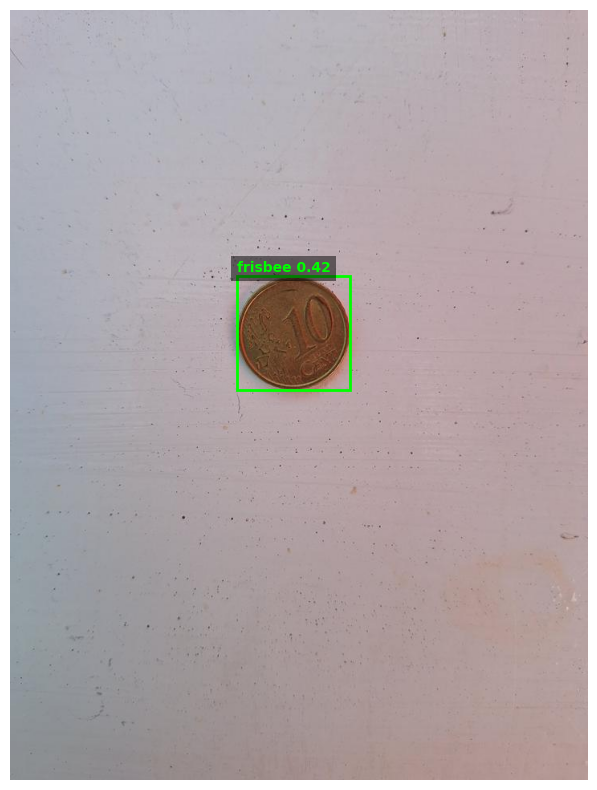

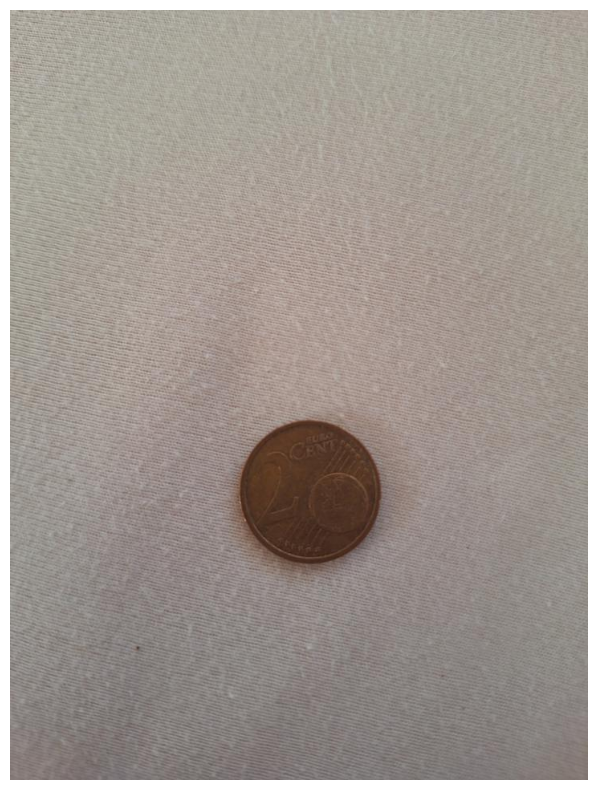

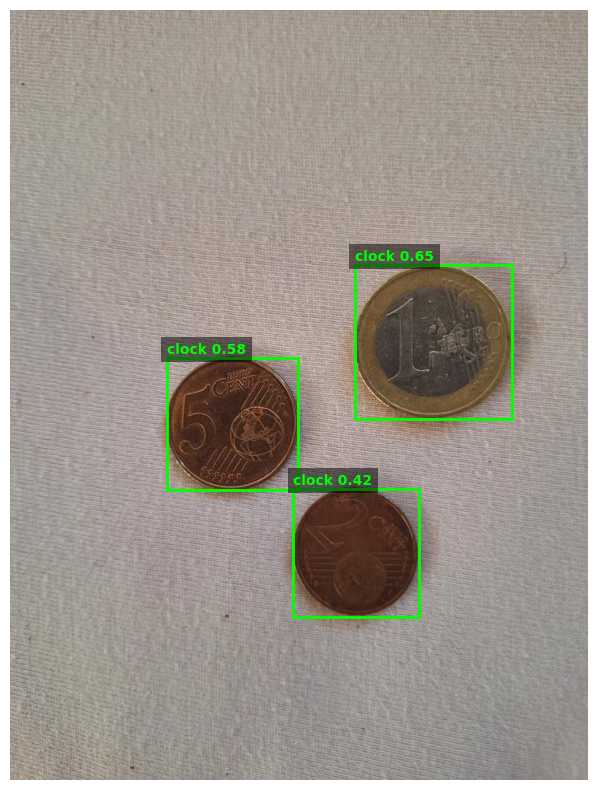

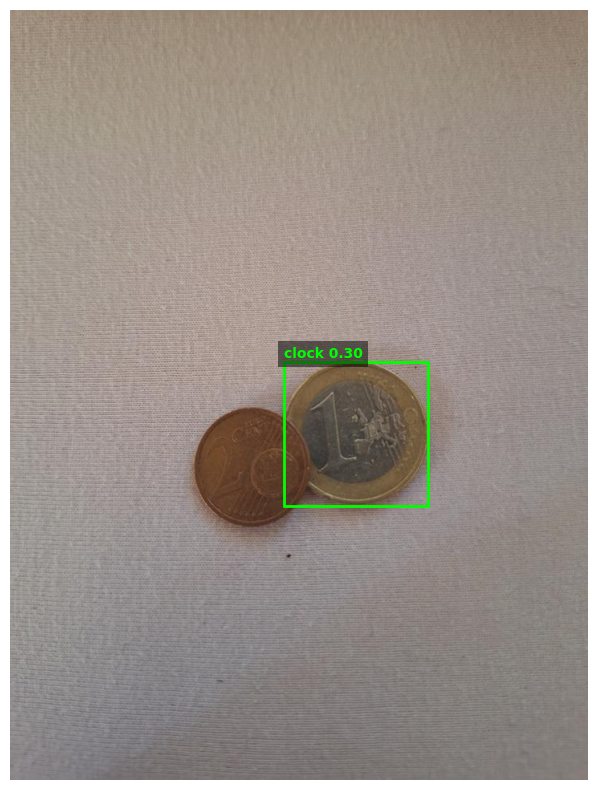

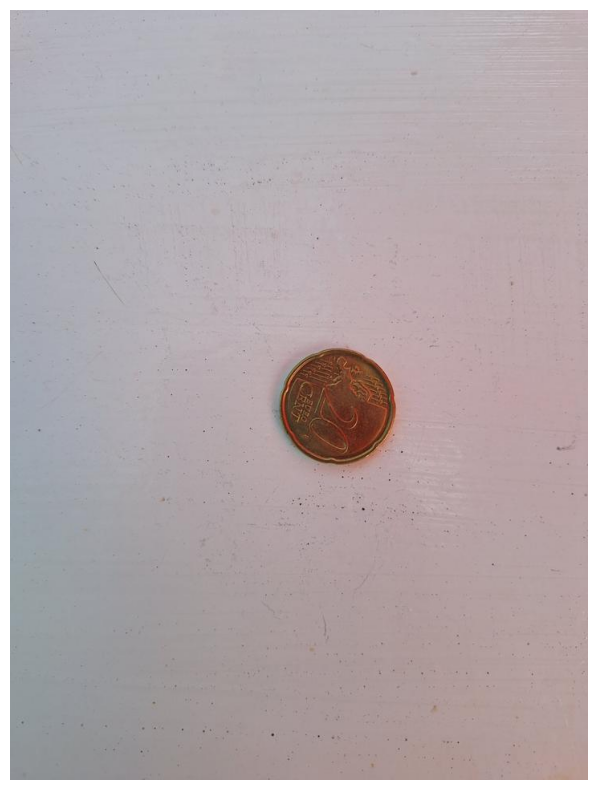

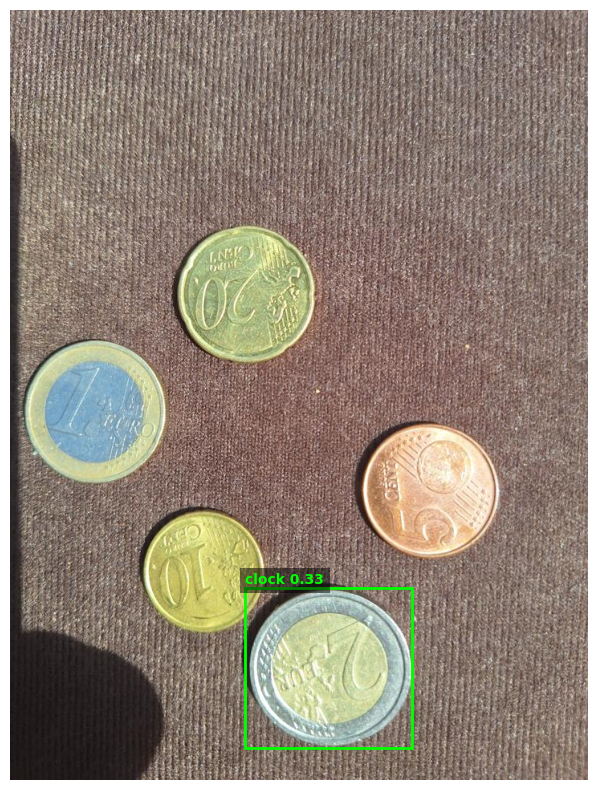

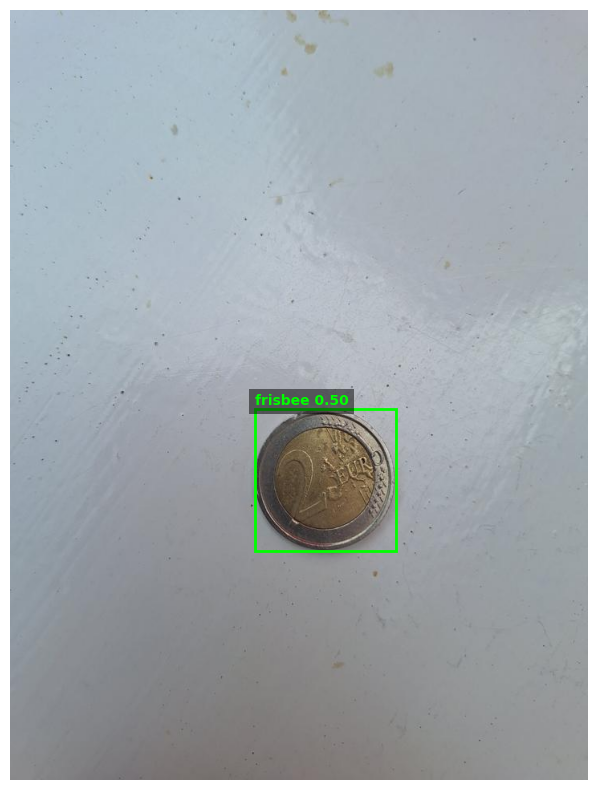

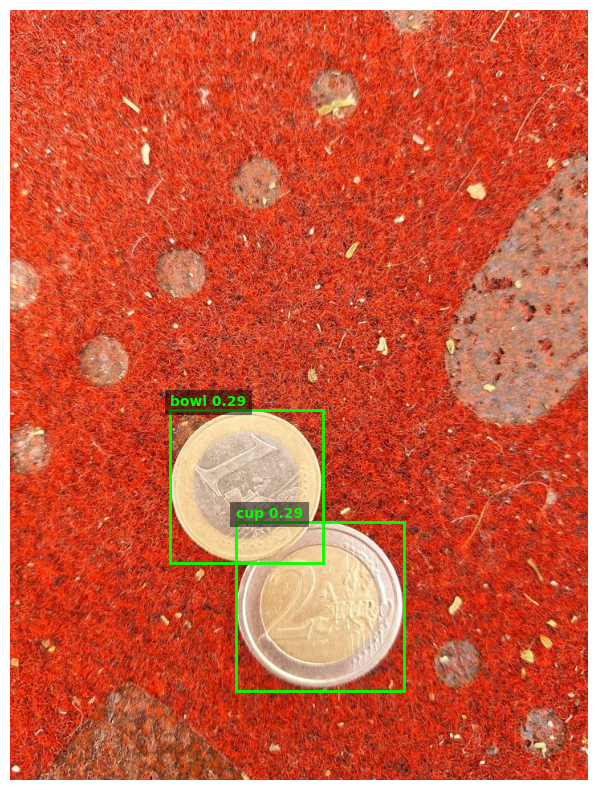

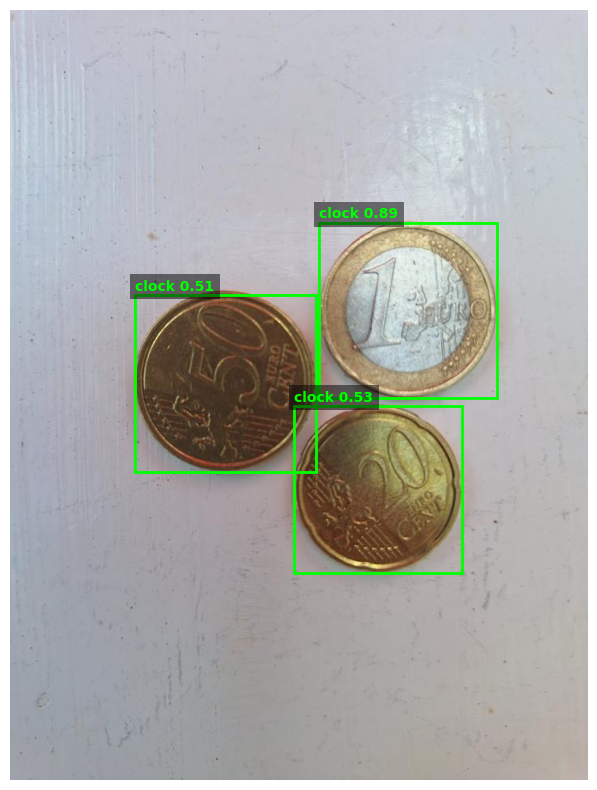

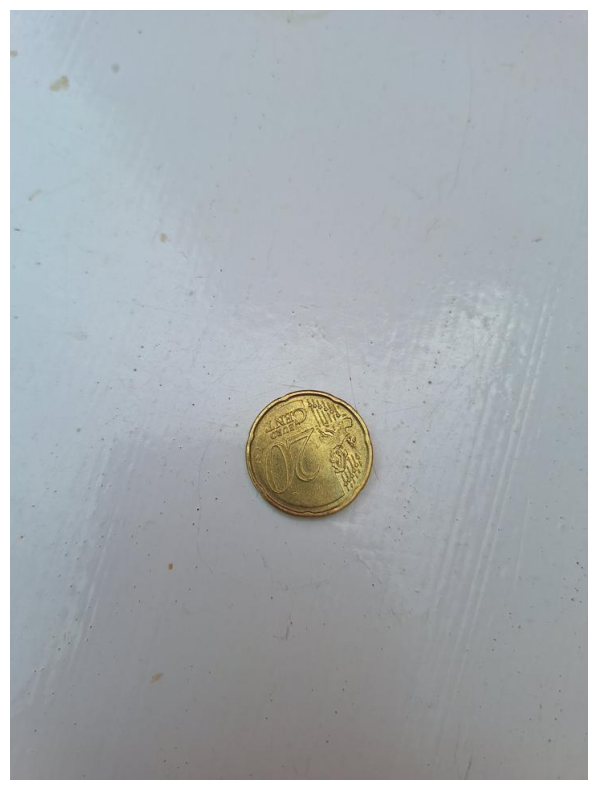

In [7]:
import matplotlib.patches as patches
from matplotlib import pyplot as plt
from PIL import Image

results = model.predict(source='dataset/images/test', conf=0.25, save=False)

# Mostrar algumas imagens (ex: 10 primeiras)
for r in results[:10]:
    img = Image.open(r.path).convert("RGB")
    fig, ax = plt.subplots(1, figsize=(10, 8))
    ax.imshow(img)

    boxes = r.boxes.xyxy.cpu().numpy()
    scores = r.boxes.conf.cpu().numpy()
    classes = r.boxes.cls.cpu().numpy()
    class_names = model.names

    for box, score, cls_id in zip(boxes, scores, classes):
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        class_name = class_names[int(cls_id)]
        rect = patches.Rectangle((x1, y1), w, h,
                                 linewidth=2, edgecolor='lime', facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1 - 5,
                f'{class_name} {score:.2f}',
                color='lime', fontsize=10, weight='bold',
                bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

    ax.axis('off')
    plt.tight_layout()
    plt.show()

#Fine-Tunning

In [9]:

model = YOLO('yolov8m.pt')

model.train(
    data='dataset/data.yaml',
    epochs=200,
    imgsz=224,
    batch=16,

    # ---- Data augmentation ----
    fliplr=True,          # Flip horizontal (left-right)
    flipud=True,          # Flip vertical (up-dowm)
    #hsv_h=0.015,        # Hue augmentation
    hsv_v=0.4,          # Value augmentation
    degrees=30.0,       # Random rotation ±10°
    translate=0.1,      # Random translation ±10%
    #scale=0.2,          # Random scale
    #shear=2.0,          # Random shear ±2°
    #perspective=0.2,    # Perspective augmentation
    #mosaic=True,        # Mosaic augmentation
    mixup=False,          # MixUp augmentation
    patience=10,
    augment=False,   # enables augmentations preview
    visualize=False,  # shows images with augmentations
    project='runs/train',   # parent folder
    name='coins',   # subfolder for this run
    exist_ok=True           # overwrite if the folder already exists
)

Ultralytics 8.3.214 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset/data.yaml, degrees=30.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=True, fliplr=True, flipud=True, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=False, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=coins, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.0, plots=True, pose=12.0, pr

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e9468ee0440>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,

#Load Best Weights

In [10]:
model = YOLO('runs/train/coins/weights/best.pt')

In [11]:
# Avaliar no conjunto de teste
metrics = model.val(split='test', plots=False)  # não salva plots automáticos

# Métricas globais
precision = metrics.box.p  # Precision
recall = metrics.box.r     # Recall
f1 = metrics.box.f1        # F1-score
map50 = metrics.box.map50  # mAP@0.5
map = metrics.box.map      # mAP@[0.5:0.95]

Ultralytics 8.3.214 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,844,392 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 369.9±501.1 MB/s, size: 48.8 KB)
val: Scanning /content/dataset/labels/test... 31 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 31/31 527.1it/s 0.1s
val: New cache created: /content/dataset/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 4.0it/s 0.5s
                   all         31         58      0.757      0.788      0.835      0.737
                    1C          7          7          1      0.628       0.92      0.804
                    2C          8          9      0.794          1      0.962       0.89
                    5C          7          8      0.865      0.802      0.955       0.85
                   10C          3          3          1          0      0.732      0.682
 

#Test Set Qualitative Analysis


image 1/31 /content/dataset/images/test/002.jpg: 224x192 1 50C, 14.0ms
image 2/31 /content/dataset/images/test/009.jpg: 224x192 1 2C, 13.9ms
image 3/31 /content/dataset/images/test/018.jpg: 224x192 1 2C, 1 1Eu, 13.9ms
image 4/31 /content/dataset/images/test/028.jpg: 224x192 1 1Eu, 13.9ms
image 5/31 /content/dataset/images/test/034.jpg: 224x192 1 50C, 13.8ms
image 6/31 /content/dataset/images/test/040.jpg: 224x192 2 20Cs, 1 1Eu, 1 2Eu, 13.9ms
image 7/31 /content/dataset/images/test/042.jpg: 224x192 1 2Eu, 13.9ms
image 8/31 /content/dataset/images/test/044.jpg: 224x192 1 1Eu, 1 2Eu, 13.9ms
image 9/31 /content/dataset/images/test/046.jpg: 224x192 2 20Cs, 1 1Eu, 13.8ms
image 10/31 /content/dataset/images/test/056.jpg: 224x192 1 50C, 9.8ms
image 11/31 /content/dataset/images/test/058.jpg: 224x192 1 50C, 1 1Eu, 1 2Eu, 9.7ms
image 12/31 /content/dataset/images/test/059.jpg: 224x192 1 20C, 9.8ms
image 13/31 /content/dataset/images/test/062.jpg: 224x192 1 2C, 1 1Eu, 10.2ms
image 14/31 /content

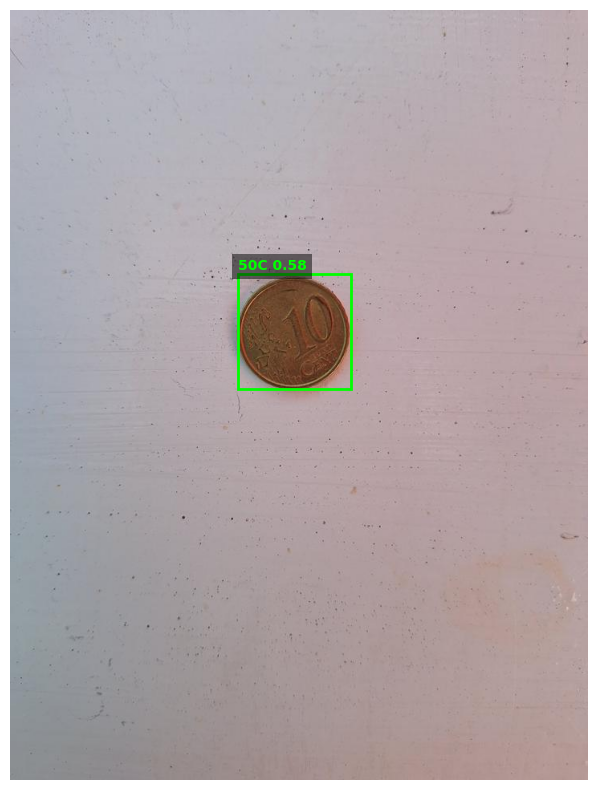

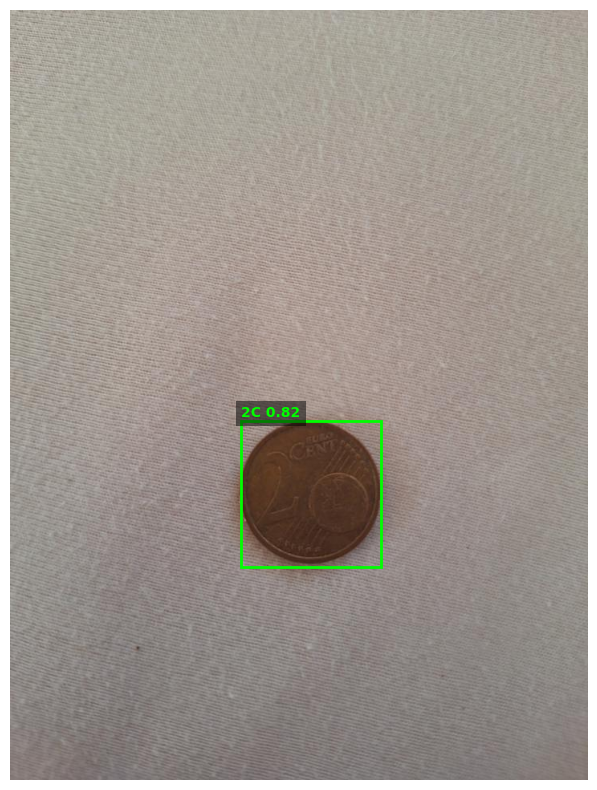

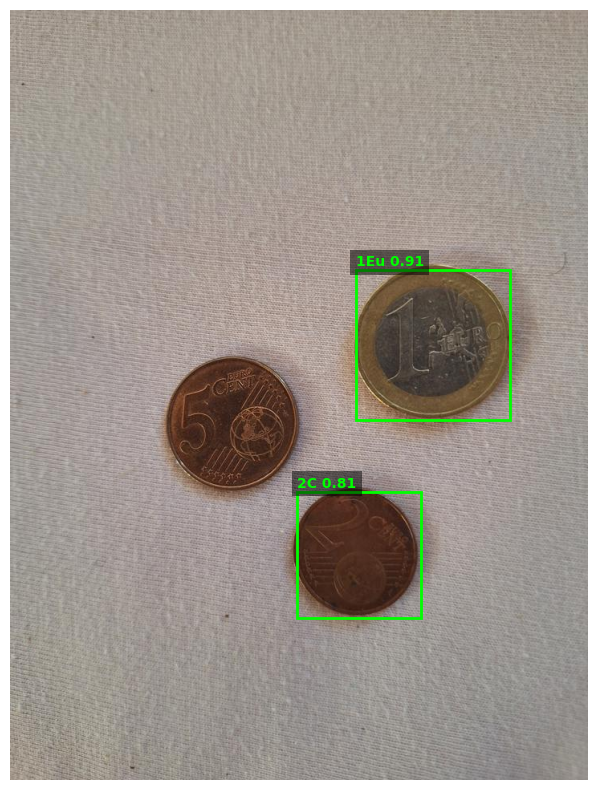

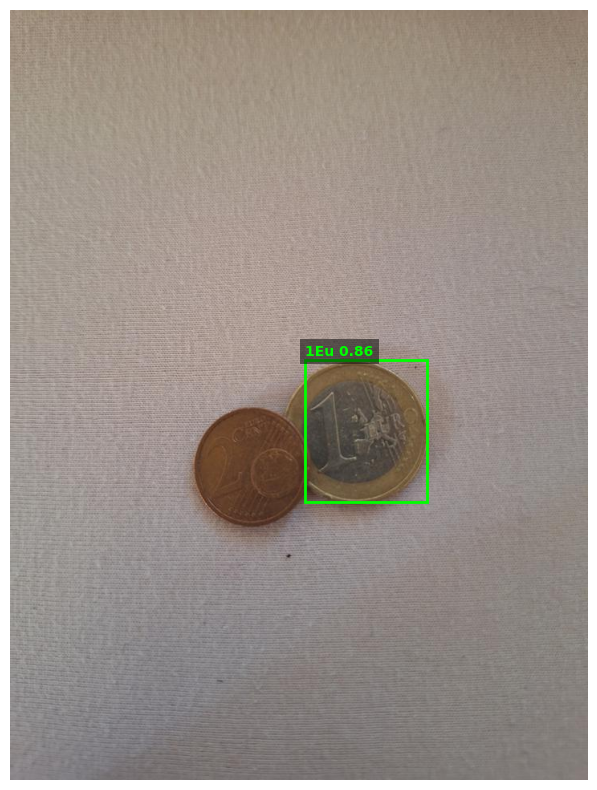

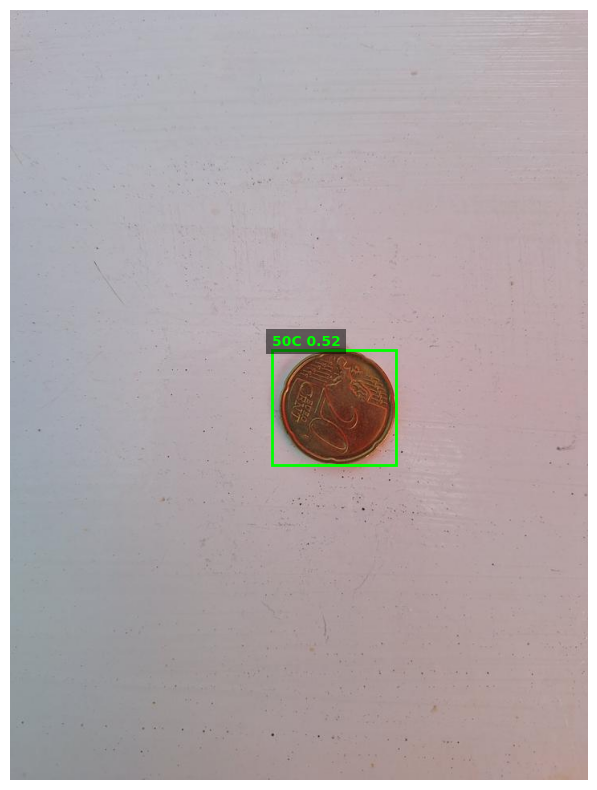

...

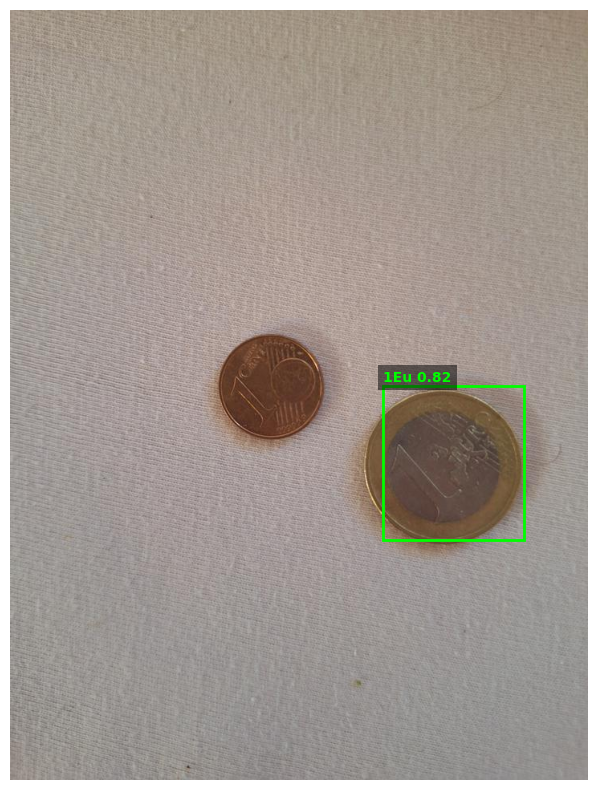

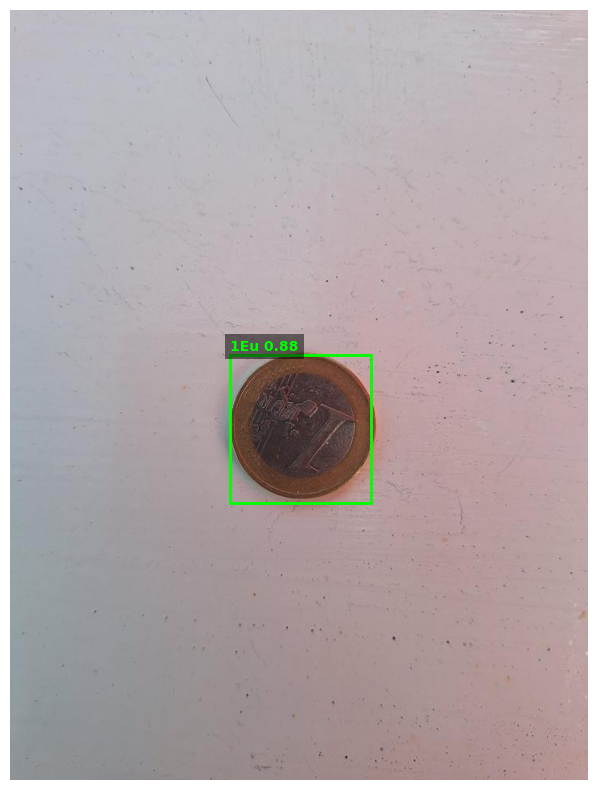

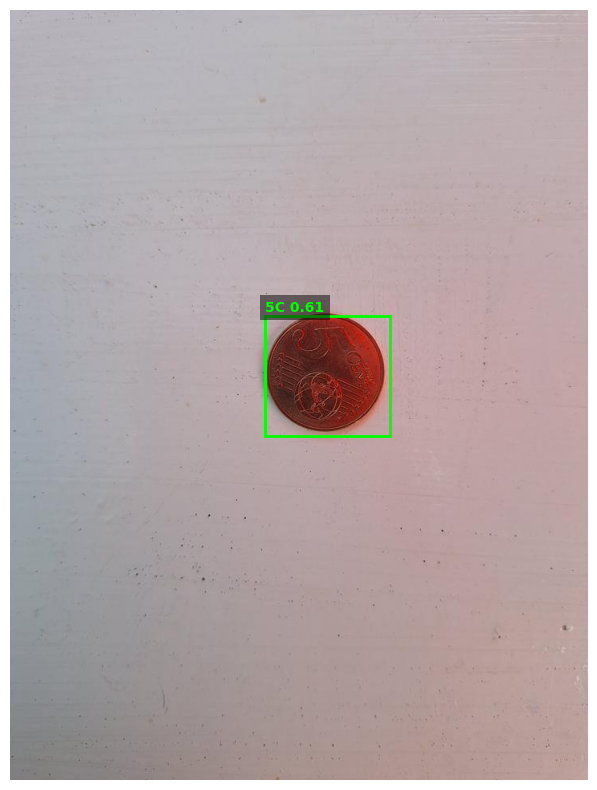

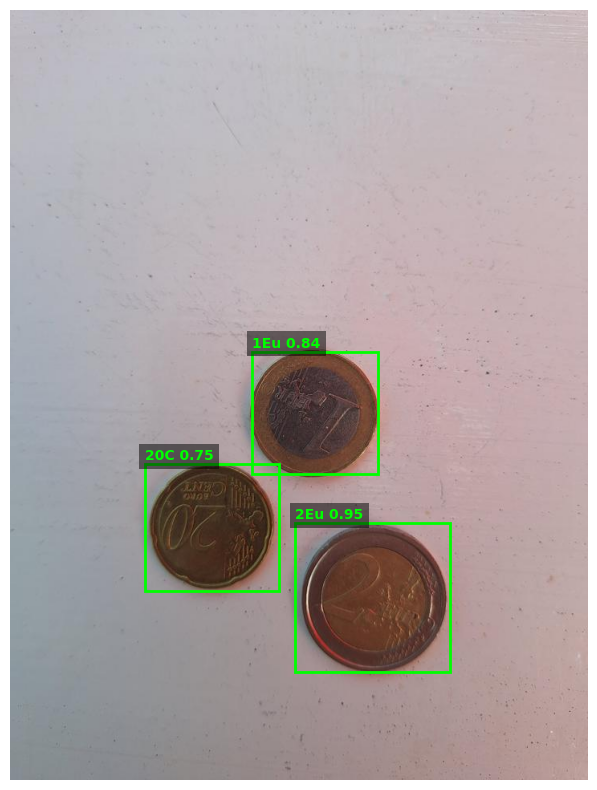

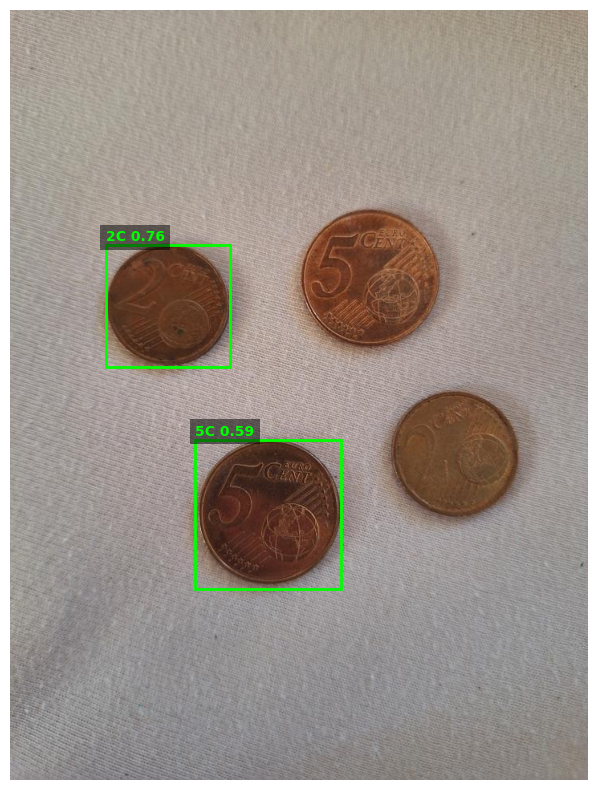

In [13]:
import matplotlib.patches as patches
from matplotlib import pyplot as plt
from PIL import Image
from ultralytics import YOLO


# Rodar inferência no conjunto de teste
results = model.predict(source='dataset/images/test', conf=0.50, save=False)

# Mostrar algumas imagens (ex: 10 primeiras)
for r in results[:20]:
    img = Image.open(r.path).convert("RGB")
    fig, ax = plt.subplots(1, figsize=(10, 8))
    ax.imshow(img)

    boxes = r.boxes.xyxy.cpu().numpy()
    scores = r.boxes.conf.cpu().numpy()
    classes = r.boxes.cls.cpu().numpy()
    class_names = model.names

    for box, score, cls_id in zip(boxes, scores, classes):
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        class_name = class_names[int(cls_id)]
        rect = patches.Rectangle((x1, y1), w, h,
                                 linewidth=2, edgecolor='lime', facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1 - 5,
                f'{class_name} {score:.2f}',
                color='lime', fontsize=10, weight='bold',
                bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

    ax.axis('off')
    plt.tight_layout()
    plt.show()